In [1]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.ndimage import gaussian_filter
from sklearn.cluster import HDBSCAN
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

In [90]:
all_rec_dict = np.load("new_data.npy", allow_pickle=True).tolist()

In [114]:
ca1 = []
ca3 = []
for key in all_rec_dict.keys():
    print(key)
    n = 0
    for rec in all_rec_dict[key]:
        if np.max(rec[0][5000:15000, 0]) < 100 and np.max(rec[1][5000:15000, 0]) < 100 and np.min(rec[1][5000:15000, 0]) > -50:
            n += 1
            ca1.append(rec[0][5000:15000, 0])
            ca3.append(rec[1][5000:15000, 0])     
    print(n)

100
6
200
6
300
6
400
6
500
6
600
8
700
8
800
8
900
8
1000
9


In [140]:
AFTER500 = 30

In [115]:
ca1 = np.array(ca1)
ca3 = np.array(ca3)

In [105]:
ca1.shape

(81, 10000)

In [106]:
pca = PCA(n_components=2)
ca1_transformed = pca.fit_transform(ca1)

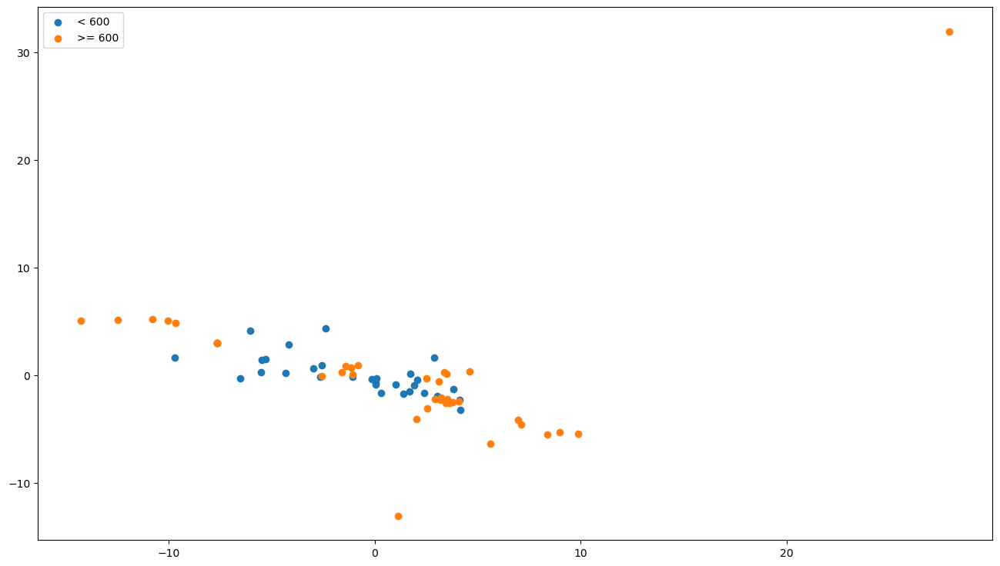

In [141]:
plt.figure(figsize=(16, 9))
plt.scatter(ca1_transformed[:AFTER500, 0], ca1_transformed[:AFTER500, 1], label="< 600")
plt.scatter(ca1_transformed[AFTER500:, 0], ca1_transformed[AFTER500:, 1], label=">= 600")
plt.legend()

In [117]:
pca = PCA(n_components=2)
ca3_transformed = pca.fit_transform(ca3)

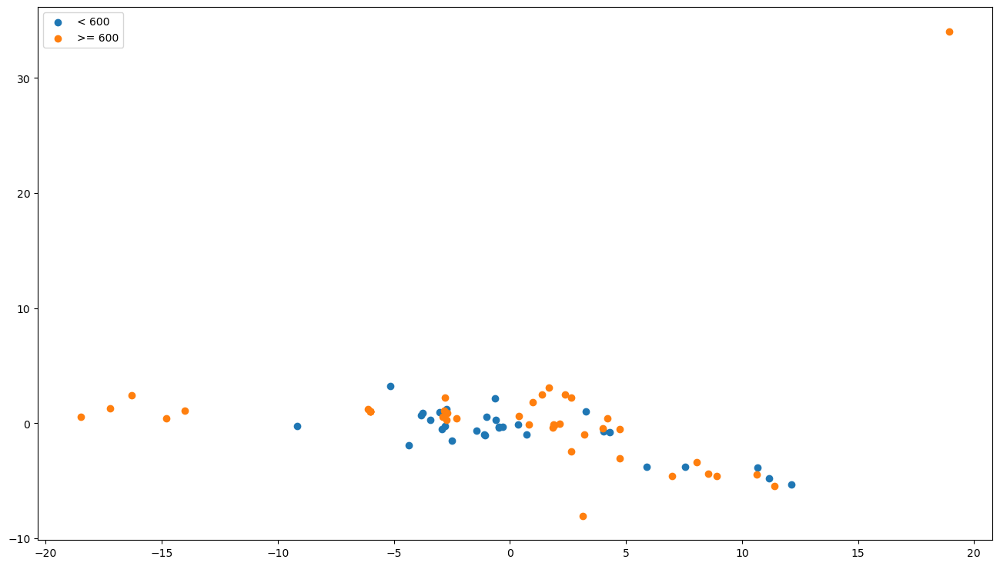

In [142]:
plt.figure(figsize=(16, 9))
plt.scatter(ca3_transformed[:AFTER500, 0], ca3_transformed[:AFTER500, 1], label="< 600")
plt.scatter(ca3_transformed[AFTER500:, 0], ca3_transformed[AFTER500:, 1], label=">= 600")
plt.legend()

In [119]:
def removeArts(signal):
    s = signal.copy()
    mean = np.mean(s)
    normS = normalization(s)
    for i in range(5200, 5300):
        if abs(normS[i])>0.7:
            s[i] = s[i-100]
    normS = normalization(s)
    for i in range(0, 5200):
        if abs(normS[i])>5:
            s[i] = mean
    for i in range(6000, len(s)):
        if abs(normS[i])>5:
            s[i] = mean
    normS = normalization(s)
    for i in range(0, 5200):
        if abs(normS[i])>5:
            s[i] = mean
    for i in range(6000, len(s)):
        if abs(normS[i])>5:
            s[i] = mean
    normS = normalization(s)
    for i in range(5200, 5240):
        if abs(normS[i])>0.5:
            s[i] = s[i-40]
    return s

def normalization(s):
    return np.array((s-s.mean())/s.std())

In [120]:
ca1_preproc = np.array([removeArts(rec) for rec in ca1])
ca3_preproc = np.array([removeArts(rec) for rec in ca3])

In [121]:
ca1_preproc -= ca1_preproc.mean(axis=1)[..., None]
ca3_preproc -= ca3_preproc.mean(axis=1)[..., None]

In [122]:
def gausFilter(signal, sigma = 35):
    min1 = np.min(signal)
    gf = gaussian_filter(signal, sigma)
    min2 = np.min(gf)
    return gf*min1/min2

In [123]:
ca1_filt = np.array([gausFilter(rec) for rec in ca1_preproc])
ca3_filt = np.array([gausFilter(rec) for rec in ca3_preproc])

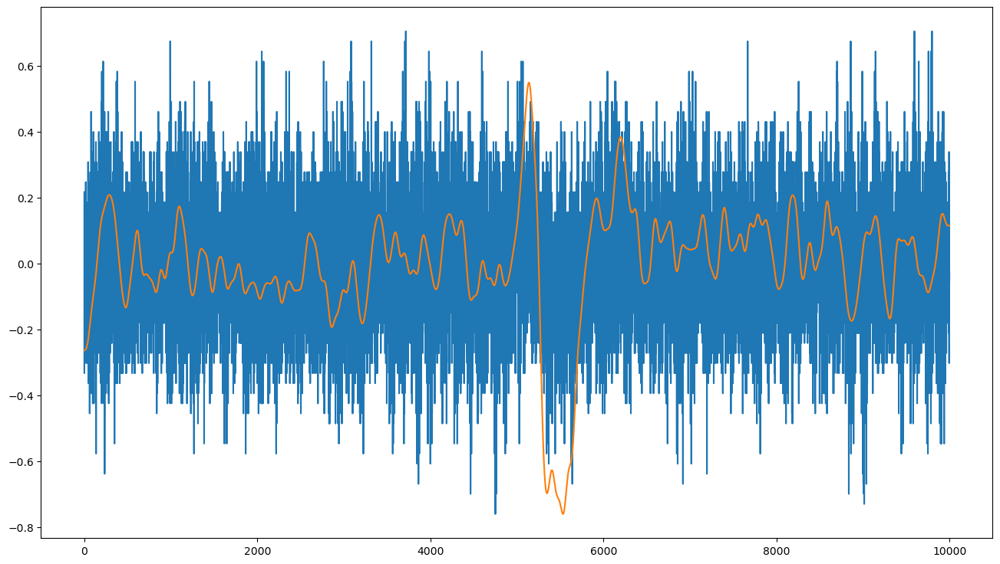

In [124]:
plt.figure(figsize=(16, 9))
plt.plot(ca1_preproc[0])
plt.plot(ca1_filt[0])

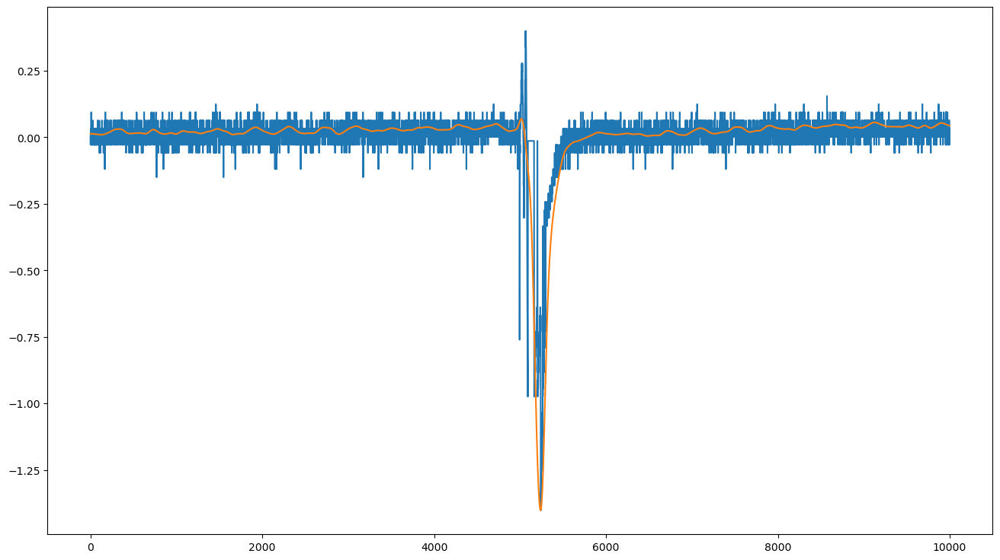

In [53]:
plt.figure(figsize=(16, 9))
plt.plot(ca1_preproc[-1])
plt.plot(ca1_filt[-1])

### CA3

In [125]:
pca = PCA(n_components=2)
ca3_transformed = pca.fit_transform(ca3_filt)

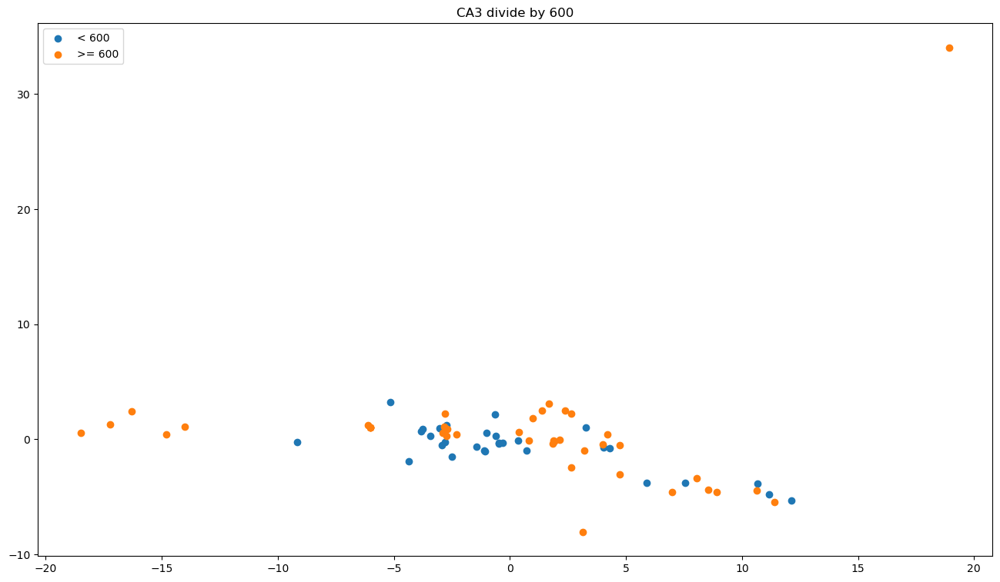

In [143]:
plt.figure(figsize=(16, 9))
plt.title("CA3 divide by 600")
plt.scatter(ca3_transformed[:AFTER500, 0], ca3_transformed[:AFTER500, 1], label="< 600")
plt.scatter(ca3_transformed[AFTER500:, 0], ca3_transformed[AFTER500:, 1], label=">= 600")
plt.legend()

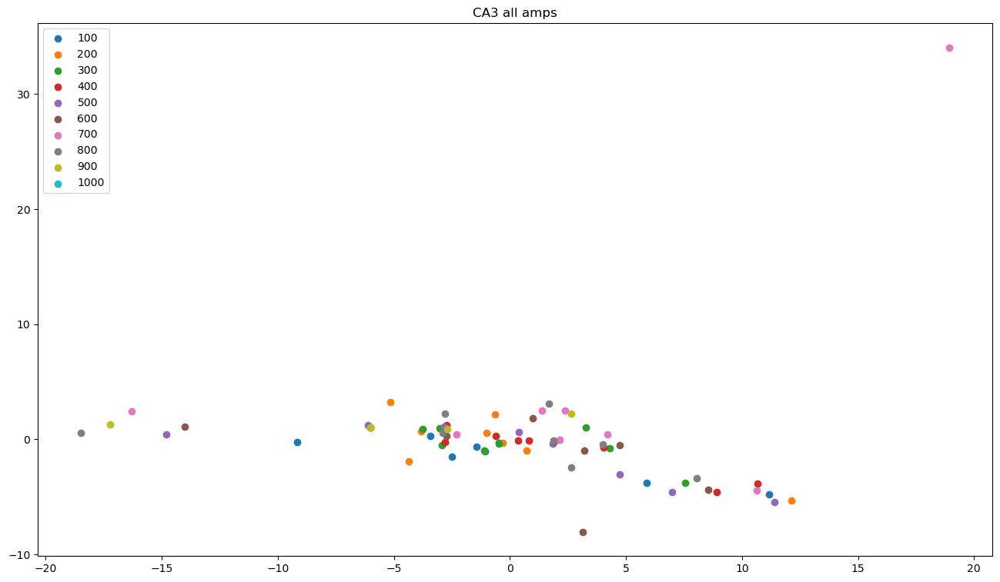

In [144]:
plt.figure(figsize=(16, 9))
plt.title("CA3 all amps")
plt.scatter(ca3_transformed[:8, 0], ca3_transformed[:8, 1], label="100")
plt.scatter(ca3_transformed[8:16, 0], ca3_transformed[8:16, 1], label="200")
plt.scatter(ca3_transformed[16:24, 0], ca3_transformed[16:24, 1], label="300")
plt.scatter(ca3_transformed[24:32, 0], ca3_transformed[24:32, 1], label="400")
plt.scatter(ca3_transformed[32:40, 0], ca3_transformed[32:40, 1], label="500")
plt.scatter(ca3_transformed[40:49, 0], ca3_transformed[40:49, 1], label="600")
plt.scatter(ca3_transformed[49:58, 0], ca3_transformed[49:58, 1], label="700")
plt.scatter(ca3_transformed[58:67, 0], ca3_transformed[58:67, 1], label="800")
plt.scatter(ca3_transformed[67:76, 0], ca3_transformed[67:76, 1], label="900")
plt.scatter(ca3_transformed[76:, 0], ca3_transformed[76:, 1], label="1000")

plt.legend()

### CA1

In [129]:
pca = PCA(n_components=2)
ca1_transformed = pca.fit_transform(ca1_filt)

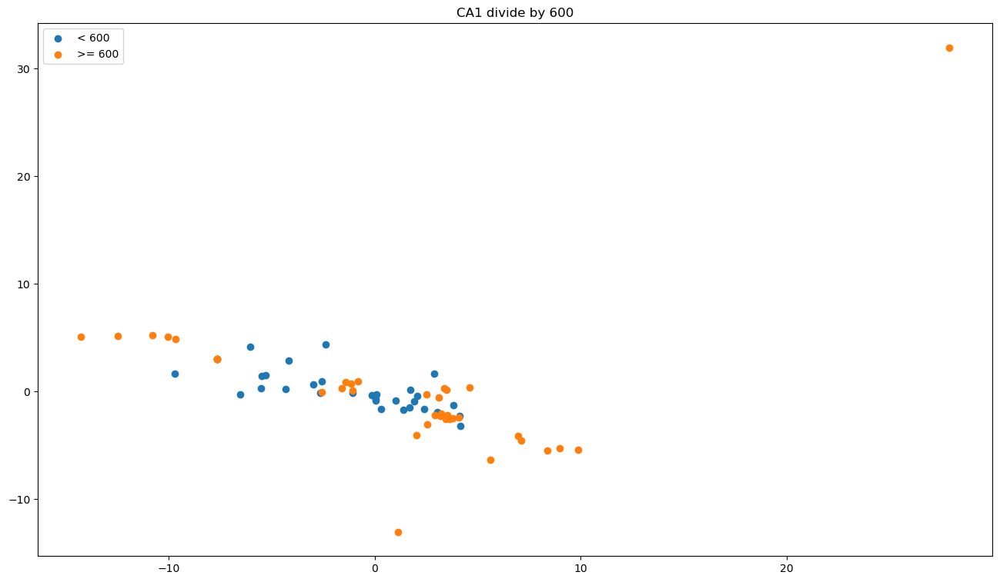

In [145]:
plt.figure(figsize=(16, 9))
plt.title("CA1 divide by 600")
plt.scatter(ca1_transformed[:AFTER500, 0], ca1_transformed[:AFTER500, 1], label="< 600")
plt.scatter(ca1_transformed[AFTER500:, 0], ca1_transformed[AFTER500:, 1], label=">= 600")
plt.legend()

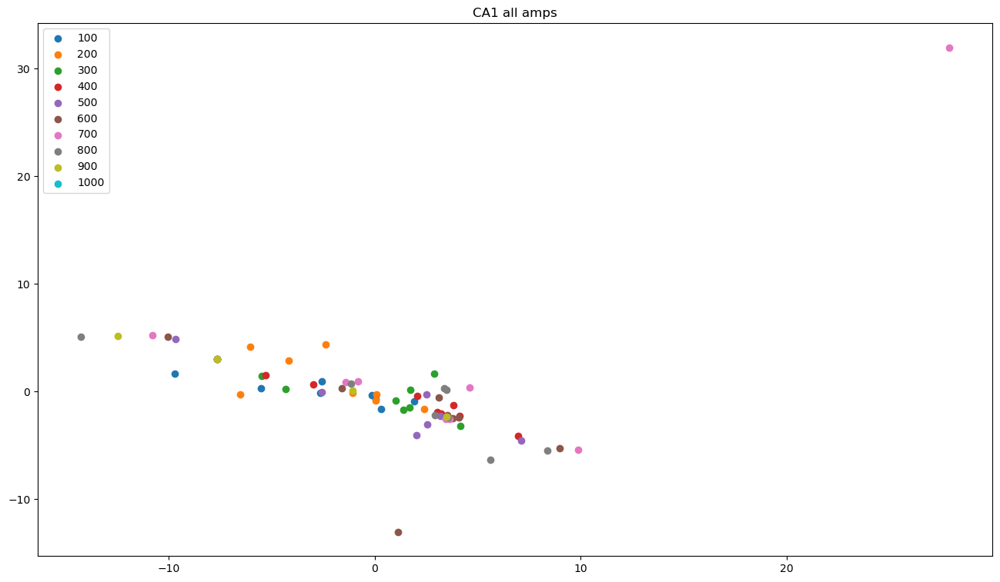

In [131]:
plt.figure(figsize=(16, 9))
plt.title("CA1 all amps")
plt.scatter(ca1_transformed[:8, 0], ca1_transformed[:8, 1], label="100")
plt.scatter(ca1_transformed[8:16, 0], ca1_transformed[8:16, 1], label="200")
plt.scatter(ca1_transformed[16:24, 0], ca1_transformed[16:24, 1], label="300")
plt.scatter(ca1_transformed[24:32, 0], ca1_transformed[24:32, 1], label="400")
plt.scatter(ca1_transformed[32:40, 0], ca1_transformed[32:40, 1], label="500")
plt.scatter(ca1_transformed[40:49, 0], ca1_transformed[40:49, 1], label="600")
plt.scatter(ca1_transformed[49:58, 0], ca1_transformed[49:58, 1], label="700")
plt.scatter(ca1_transformed[58:67, 0], ca1_transformed[58:67, 1], label="800")
plt.scatter(ca1_transformed[67:76, 0], ca1_transformed[67:76, 1], label="900")
plt.scatter(ca1_transformed[76:, 0], ca1_transformed[76:, 1], label="1000")

plt.legend()

### Metrics

In [132]:
MAXLEN = 10000

In [133]:
def normMetrics(signal, maxlen=MAXLEN):
    if abs(signal[np.argmin(signal)]) >= abs(signal[np.argmax(signal)]):
        left = right = argmin = semiLeft = semiRight = np.argmin(signal) #if absmax>absmin {argmax or argmin} #flag: min or max 
        minValue = signal[argmin]
        semiMin = minValue/2
        mean = np.mean(signal)
        found = False
        while signal[left]<mean and left>0: #>mean
            left-=1
            if (signal[left]>semiMin) and not found:
                semiLeft = left
                found = True
        found = False
        while signal[right]<mean and right<len(signal)-1: #>mean
            right+=1
            if (signal[right]>semiMin) and not found:
                semiRight = right
                found = True
        #SL = np.degrees(np.arctan((argmin-left) / (20*minValue)))
        SL = (argmin-left) / (abs(minValue))
        HW = (semiRight-semiLeft)
        TR = (argmin - left)
        #TR = argmin - np.argmax(signal)
        TD = (right - argmin)
        MV = minValue
    else:
        left = right = argmax = semiLeft = semiRight = np.argmax(signal) #if absmax>absmin {argmax or argmin} #flag: min or max 
        maxValue = signal[argmax]
        semiMin = maxValue/2
        mean = np.mean(signal)
        found = False
        while signal[left]>mean and left>0: 
            left-=1
            if (signal[left]>semiMin) and not found:
                semiLeft = left
                found = True
        found = False
        while signal[right]>mean and right<len(signal)-1: #>mean
            right+=1
            if (signal[right]>semiMin) and not found:
                semiRight = right
                found = True
        SL = (argmax-left) / maxValue
        HW = semiRight-semiLeft
        TD = argmax - left
        TR = right - argmax
        MV = maxValue
        
    return [SL, HW, TD, TR, MV]

In [134]:
normMetrics(ca1_filt[0])

[368.6301081401825, 397, 266, 280, -0.7595689929199211]

In [165]:
metrics_ca1 = np.array([normMetrics(rec) for rec in ca1_filt])
metrics_ca3 = np.array([normMetrics(rec) for rec in ca3_filt])


In [166]:
metrics_ca1.shape

(71, 5)

In [167]:
metrics_ca1 = (metrics_ca1 - metrics_ca1.mean(axis=0)[None, ...]) / metrics_ca1.std(axis=0)[None, ...]
metrics_ca3 = (metrics_ca3 - metrics_ca3.mean(axis=0)[None, ...]) / metrics_ca3.std(axis=0)[None, ...]


In [171]:
columns = ["Slope", "Half Width", "Time Decrise", "Time Rise", "Amplitude"]
df_ca1 = pd.DataFrame(metrics_ca1, columns=columns)
df_ca3 = pd.DataFrame(metrics_ca3, columns=columns)


In [172]:
Y = np.zeros(len(ca1))
Y[AFTER500:] = 1

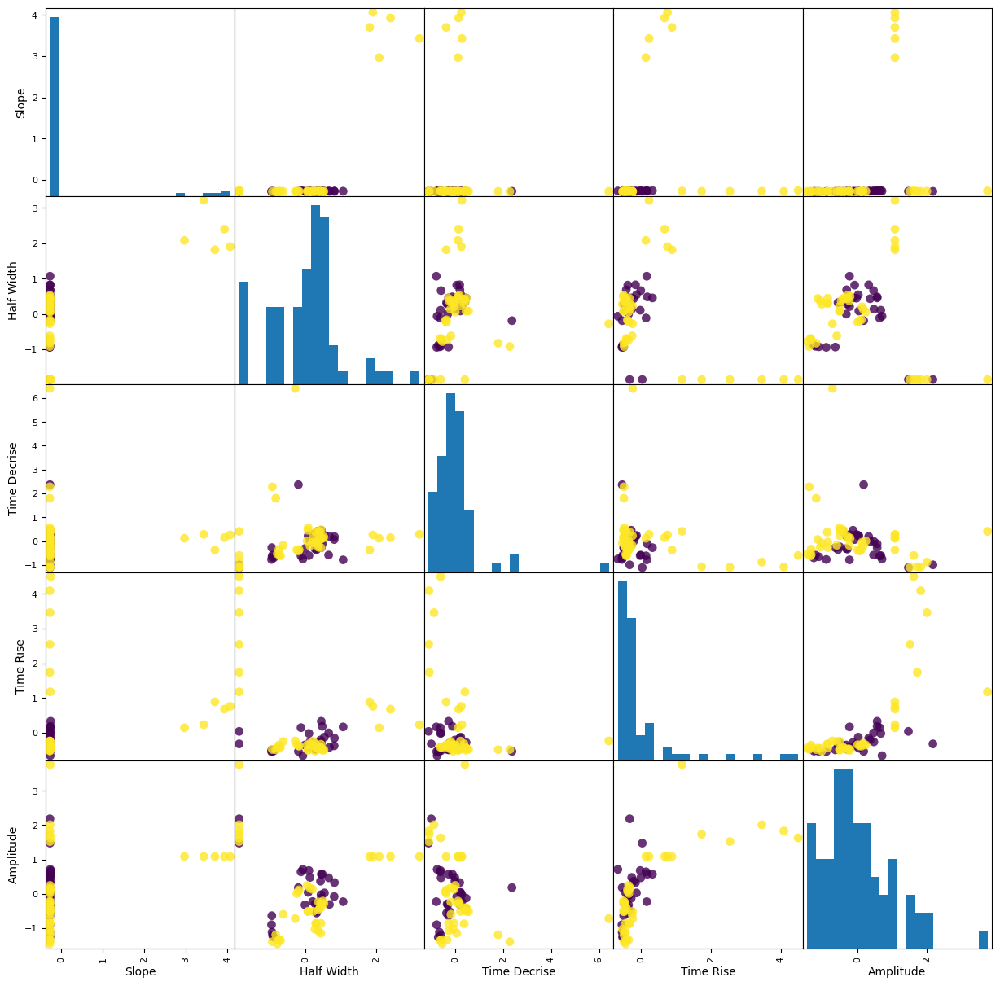

In [173]:
grr = pd.plotting.scatter_matrix(df_ca1, c=Y, figsize=(15, 15), marker='o',
                                 hist_kwds={'bins': 20}, s=60, alpha=.8)

In [149]:
Y = np.zeros(len(ca1))
Y[:6] = 0
Y[6:12] = 1
Y[12:18] = 2
Y[18:24] = 3
Y[24:30] = 4
Y[30:38] = 5
Y[38:46] = 6
Y[46:54] = 7
Y[54:62] = 8
Y[62:] = 9

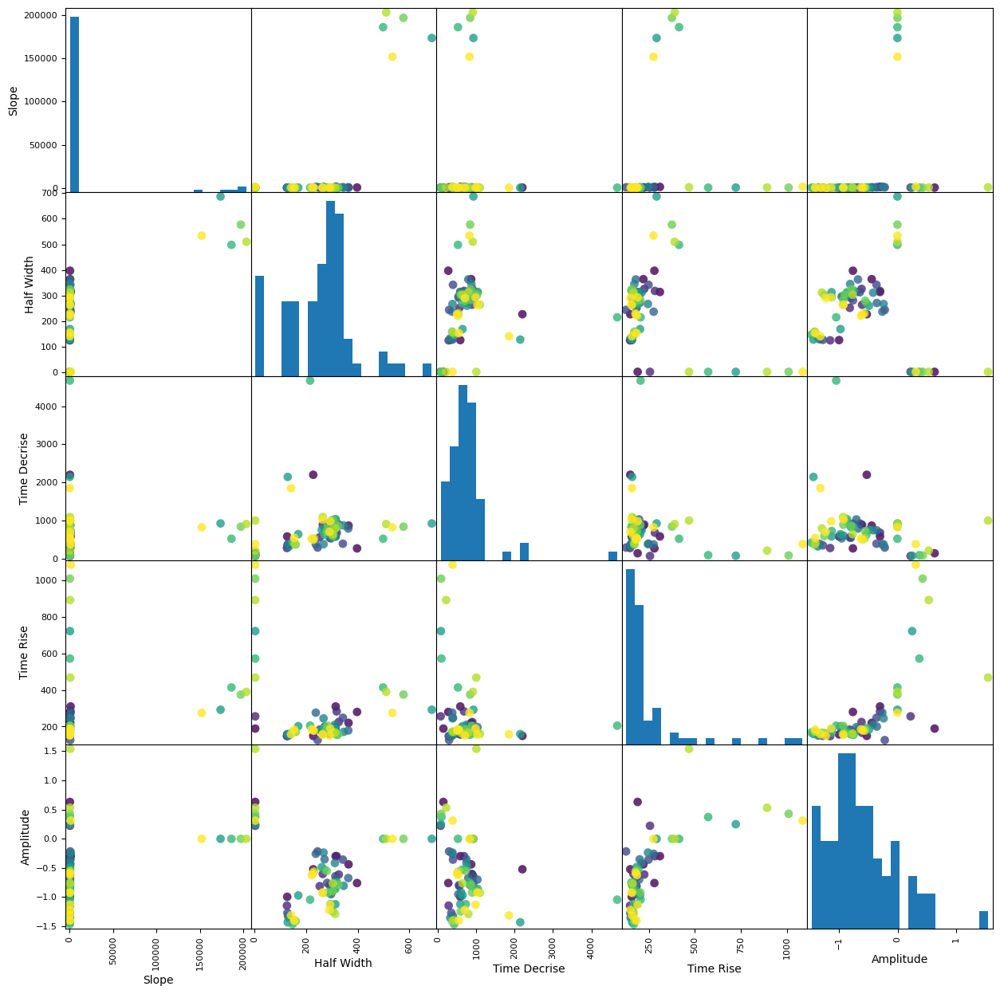

In [150]:
grr = pd.plotting.scatter_matrix(df_ca1, c=Y, figsize=(15, 15), marker='o',
                                 hist_kwds={'bins': 20}, s=60, alpha=.8)

In [18]:
df_ca1

,0,1,2,3,4
0,368.630108,397.0,266.0,280.0,-0.759569
1,500.520987,364.0,865.0,220.0,-0.439542
2,218.620157,2.0,138.0,189.0,0.631232
3,1038.156263,314.0,580.0,310.0,-0.298606
4,284.614780,227.0,2201.0,149.0,-0.523515
...,...,...,...,...,...
86,296.864362,221.0,523.0,185.0,-0.623180
87,204.900087,332.0,741.0,161.0,-0.785749
88,152058.820953,534.0,821.0,275.0,-0.001809
89,1219.050924,2.0,379.0,1085.0,0.310898


### Clustering 

In [196]:
hdb = HDBSCAN(min_cluster_size=7)
ca1_hdb = hdb.fit_predict(ca1_filt)
ca3_hdb = hdb.fit_predict(ca3_filt)


In [200]:
clast_nums = np.unique(ca1_hdb, return_counts=True)

In [201]:
clast_nums


(array([-1,  0,  1,  2], dtype=int64), array([22, 11, 31,  7], dtype=int64))

In [203]:
print("1 класс", clast_nums[1][0] / 91, "2 класс", clast_nums[1][1] / 91, "3 класс", clast_nums[1][2] / 91, "4 класс", clast_nums[1][2] / 91)

1 класс 0.24175824175824176 2 класс 0.12087912087912088 3 класс 0.34065934065934067 4 класс 0.34065934065934067


In [204]:
ca1_hdb

array([-1,  1, -1, -1, -1,  0,  1,  1, -1,  1,  1,  0,  1,  1, -1, -1,  1,
        0,  1,  1,  2,  1, -1,  0,  1,  1,  2,  1,  1,  0, -1,  1, -1,  1,
        1,  2, -1,  0, -1,  1, -1,  1,  1,  2, -1,  0, -1,  1,  1,  1,  1,
        2, -1,  0, -1,  1, -1,  1,  1,  2, -1,  0, -1,  1,  1,  0, -1,  1,
        2, -1,  0], dtype=int64)

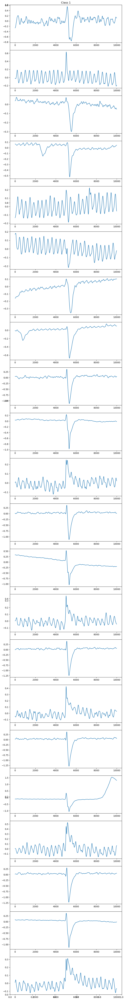

In [237]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 1")
class1_ca1 = ca1_filt[ca1_hdb==-1]
for i in range(clast_nums[1][0]):
    ax = fig.add_subplot(clast_nums[1][0], 1, i+1)
    ax.plot(class1_ca1[i])
plt.savefig("Class1RawSignal.pdf")         

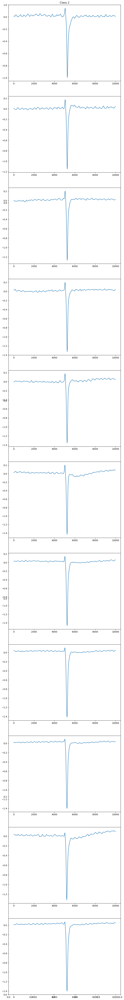

In [238]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 2")
class2_ca1 = ca1_filt[ca1_hdb==0]
for i in range(clast_nums[1][1]):
    ax = fig.add_subplot(clast_nums[1][1], 1, i+1)
    ax.plot(class2_ca1[i])
plt.savefig("Class2RawSignal.pdf")         
    

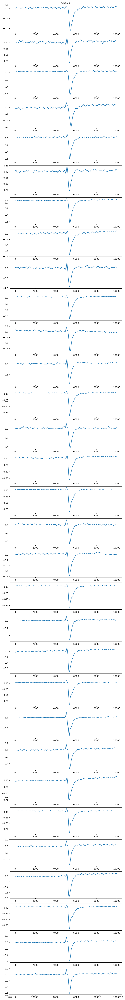

In [239]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 3")
class3_ca1 = ca1_filt[ca1_hdb==1]
for i in range(clast_nums[1][2]):
    ax = fig.add_subplot(clast_nums[1][2], 1, i+1)
    ax.plot(class3_ca1[i])
plt.savefig("Class3RawSignal.pdf")         
    

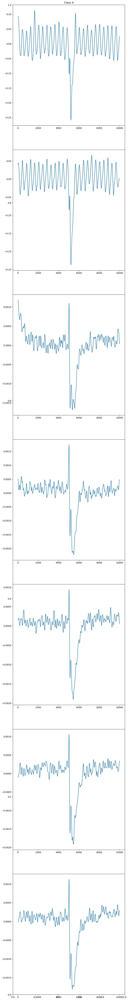

In [240]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 4")
class4_ca1 = ca1_filt[ca1_hdb==2]
for i in range(clast_nums[1][3]):
    ax = fig.add_subplot(clast_nums[1][3], 1, i+1)
    ax.plot(class4_ca1[i])
plt.savefig("Class4RawSignal.pdf")         
    

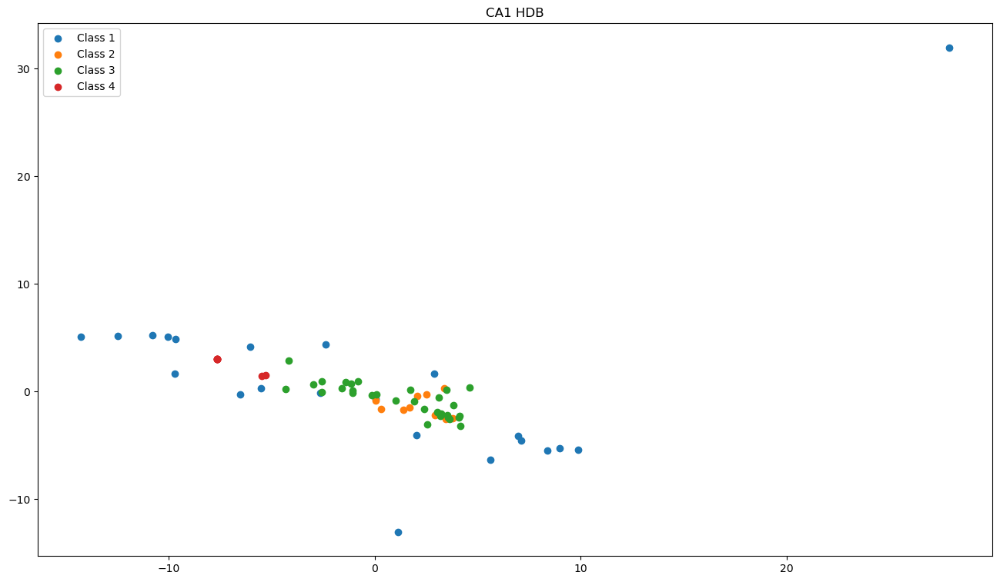

In [229]:
plt.figure(figsize=(16, 9))
plt.title("CA1 HDB")
plt.scatter(ca1_transformed[ca1_hdb == -1][:, 0], ca1_transformed[ca1_hdb == -1][:, 1], label="Class 1")
plt.scatter(ca1_transformed[ca1_hdb == 0][:, 0], ca1_transformed[ca1_hdb == 0][:, 1], label="Class 2")
plt.scatter(ca1_transformed[ca1_hdb == 1][:, 0], ca1_transformed[ca1_hdb == 1][:, 1], label="Class 3")
plt.scatter(ca1_transformed[ca1_hdb == 2][:, 0], ca1_transformed[ca1_hdb == 2][:, 1], label="Class 4")



plt.legend()

### Кластеризация по данным

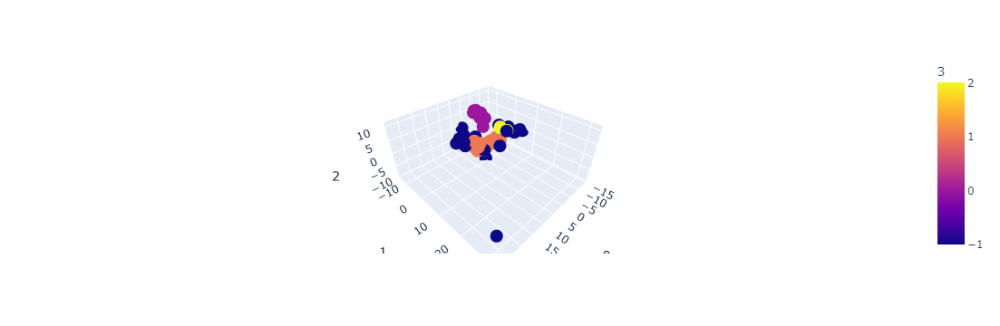

In [231]:
pca = PCA(n_components=3)
ca1_transformed3d = pca.fit_transform(ca1_filt)
df = pd.DataFrame(np.concatenate([ca1_transformed3d, ca1_hdb[..., None]], axis=1))
fig = px.scatter_3d(df, x=0, y=1, z=2, color=3)
fig.show()

### Кластеризация по метрике

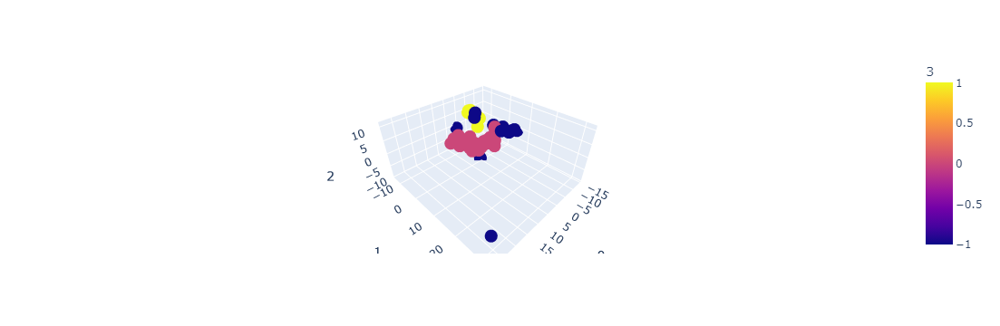

In [232]:
pca = PCA(n_components=3)
ca1_transformed3d = pca.fit_transform(ca1_filt)
df = pd.DataFrame(np.concatenate([ca1_transformed3d, ca1_hdb_metric[..., None]], axis=1))
fig = px.scatter_3d(df, x=0, y=1, z=2, color=3)
fig.show()

### Кластеризация по Фурье

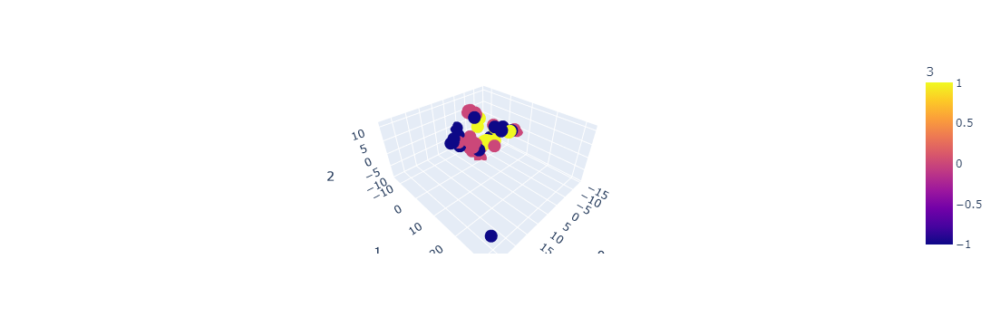

In [248]:
pca = PCA(n_components=3)
ca1_transformed3d = pca.fit_transform(ca1_filt)
df = pd.DataFrame(np.concatenate([ca1_transformed3d, ca1_hdb_fourier[..., None]], axis=1))
fig = px.scatter_3d(df, x=0, y=1, z=2, color=3)
fig.show()

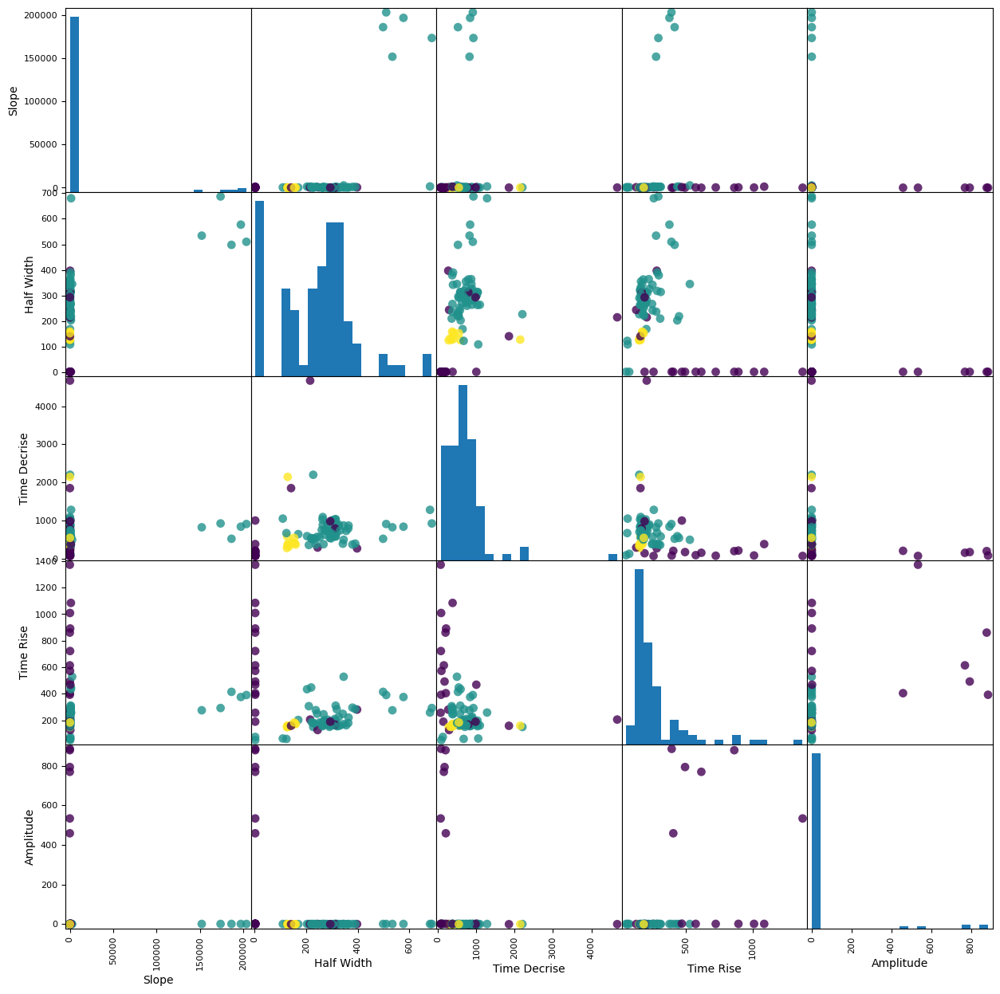

In [70]:
grr = pd.plotting.scatter_matrix(df_ca1, c=ca1_hdb, figsize=(15, 15), marker='o',
                                 hist_kwds={'bins': 20}, s=60, alpha=.8)

In [68]:
df_ca1

,Slope,Half Width,Time Decrise,Time Rise,Amplitude
0,368.630108,397.0,266.0,280.0,-0.759569
1,500.520987,364.0,865.0,220.0,-0.439542
2,218.620157,2.0,138.0,189.0,0.631232
3,1038.156263,314.0,580.0,310.0,-0.298606
4,284.614780,227.0,2201.0,149.0,-0.523515
...,...,...,...,...,...
86,296.864362,221.0,523.0,185.0,-0.623180
87,204.900087,332.0,741.0,161.0,-0.785749
88,152058.820953,534.0,821.0,275.0,-0.001809
89,1219.050924,2.0,379.0,1085.0,0.310898


### CA3

In [176]:
pca = PCA(n_components=71)
ca3_transformed = pca.fit_transform(ca3_filt)

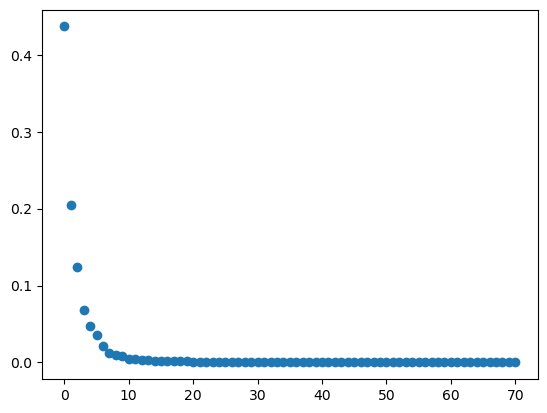

In [177]:
plt.scatter(np.arange(71), pca.explained_variance_/pca.explained_variance_.sum())

In [178]:
pca.explained_variance_/pca.explained_variance_.sum()

array([4.36745673e-01, 2.04640132e-01, 1.23917965e-01, 6.82642292e-02,
       4.67832867e-02, 3.54682697e-02, 2.14544113e-02, 1.22042800e-02,
       1.01921528e-02, 7.96053849e-03, 4.48202587e-03, 3.92863941e-03,
       3.08597900e-03, 2.78845483e-03, 2.51326167e-03, 1.87680308e-03,
       1.84813893e-03, 1.73533109e-03, 1.39409279e-03, 1.27253685e-03,
       1.14398645e-03, 8.69257580e-04, 8.17066695e-04, 7.07709772e-04,
       6.17106726e-04, 5.27888769e-04, 4.22487023e-04, 3.44733385e-04,
       2.38200279e-04, 1.89805803e-04, 1.60841532e-04, 1.56104555e-04,
       1.39645961e-04, 1.27112042e-04, 9.15910405e-05, 8.12956799e-05,
       7.52869000e-05, 6.31914874e-05, 5.89229685e-05, 5.08399732e-05,
       4.92698591e-05, 4.63340819e-05, 4.01200997e-05, 3.91341996e-05,
       3.58862462e-05, 3.26929003e-05, 3.08761736e-05, 2.72883965e-05,
       2.50471738e-05, 2.46497854e-05, 2.34009256e-05, 2.15177061e-05,
       1.99723447e-05, 1.84854532e-05, 1.59775228e-05, 1.46971381e-05,
      

Взвешенный разброс первой компоненты 43%, второй 20% 12%, 7%, 4.5%

#### Metric

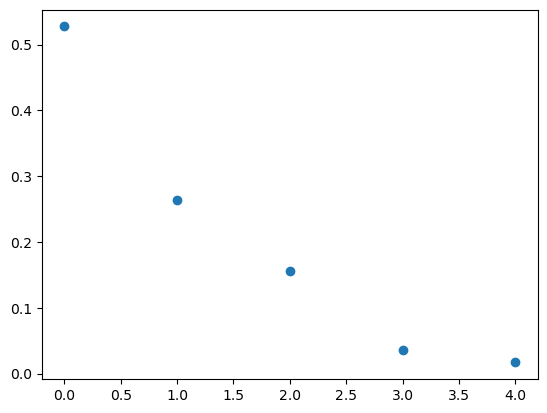

In [183]:
pca = PCA(n_components=5)
ca3_transformed_metrics = pca.fit_transform(metrics_ca3)
plt.scatter(np.arange(5), pca.explained_variance_/pca.explained_variance_.sum())

### CA 1

In [179]:
pca = PCA(n_components=71)
ca1_transformed = pca.fit_transform(ca1_filt)

In [180]:
pca.explained_variance_/pca.explained_variance_.sum()

array([3.85217535e-01, 2.39453268e-01, 2.03868260e-01, 5.96144417e-02,
       3.88474755e-02, 2.05249029e-02, 1.18967698e-02, 8.20004712e-03,
       5.75323632e-03, 4.49599737e-03, 2.84625598e-03, 2.50520672e-03,
       2.23356906e-03, 1.76439414e-03, 1.58311923e-03, 1.49445537e-03,
       1.16660710e-03, 1.07442386e-03, 9.56158837e-04, 7.81057405e-04,
       7.40333825e-04, 5.76125047e-04, 5.03920109e-04, 4.93730029e-04,
       4.08357163e-04, 3.49377318e-04, 2.72255203e-04, 2.65871197e-04,
       2.57691960e-04, 2.24505251e-04, 1.91333569e-04, 1.77653970e-04,
       1.29039424e-04, 1.01269519e-04, 9.10796272e-05, 8.13335164e-05,
       7.36697517e-05, 7.06815627e-05, 6.55402599e-05, 6.11003005e-05,
       5.44159044e-05, 5.33593204e-05, 5.03554318e-05, 4.49146589e-05,
       3.97393871e-05, 3.46608236e-05, 3.32340362e-05, 3.08098340e-05,
       2.49492081e-05, 2.39956560e-05, 2.21000496e-05, 1.99836028e-05,
       1.95882100e-05, 1.73056328e-05, 1.59501928e-05, 1.40224769e-05,
      

38% первой компоненты,  23% второй, 20%, 6%, 4%

#### Metric

In [181]:
pca = PCA(n_components=5)
ca1_transformed_metrics = pca.fit_transform(metrics_ca1)

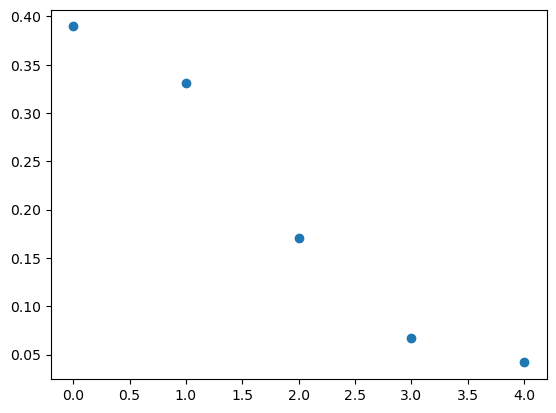

In [182]:
plt.scatter(np.arange(5), pca.explained_variance_/pca.explained_variance_.sum())

## Clustering

In [215]:
hdb = HDBSCAN(min_cluster_size=6)
ca1_hdb_metric = hdb.fit_predict(metrics_ca1)
ca3_hdb_metric = hdb.fit_predict(metrics_ca3)

In [219]:
clast_nums_ca1_metrics = np.unique(ca1_hdb_metric, return_counts=True)

In [221]:
clast_nums_ca1_metrics

(array([-1,  0,  1], dtype=int64), array([19, 43,  9], dtype=int64))

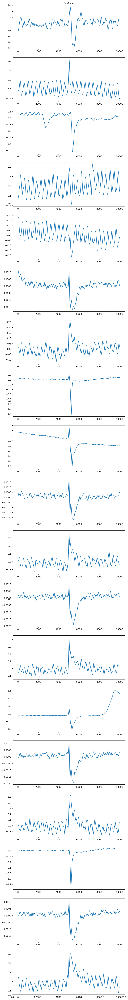

In [234]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 1")
class1_ca1 = ca1_filt[ca1_hdb_metric==-1]
for i in range(clast_nums_ca1_metrics[1][0]):
    ax = fig.add_subplot(clast_nums_ca1_metrics[1][0], 1, i+1)
    ax.plot(class1_ca1[i])
plt.savefig("Class1Metric.pdf")    

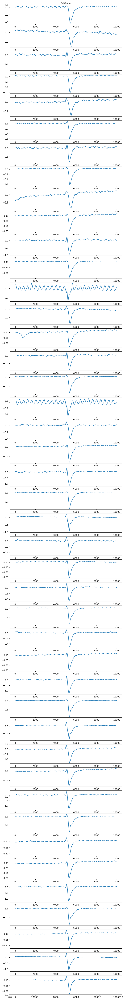

In [235]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 2")
class2_ca1 = ca1_filt[ca1_hdb_metric==0]
for i in range(clast_nums_ca1_metrics[1][1]):
    ax = fig.add_subplot(clast_nums_ca1_metrics[1][1], 1, i+1)
    ax.plot(class2_ca1[i])
plt.savefig("Class2Metric.pdf")        

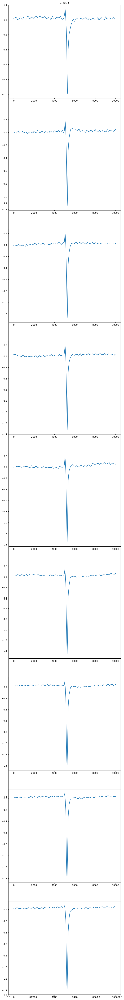

In [236]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 3")
class3_ca1 = ca1_filt[ca1_hdb_metric==1]
for i in range(clast_nums_ca1_metrics[1][2]):
    ax = fig.add_subplot(clast_nums_ca1_metrics[1][2], 1, i+1)
    ax.plot(class3_ca1[i])
plt.savefig("Class3Metric.pdf")        

### Fourier

In [242]:
ca1_fourier_max = np.max([np.abs(np.fft.rfft(rec)) for rec in ca1_filt], axis=1)
ca3_fourier_max = np.max([np.abs(np.fft.rfft(rec)) for rec in ca3_filt], axis=1)


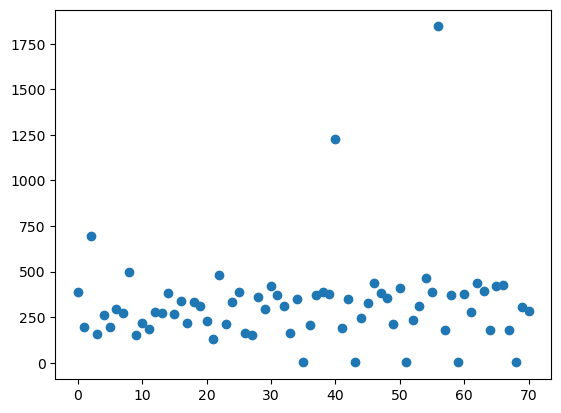

In [244]:
plt.scatter(np.arange(len(ca1_fourier_max)), ca1_fourier_max)

In [246]:
hdb = HDBSCAN(min_cluster_size=10)
ca1_hdb_fourier = hdb.fit_predict(ca1_fourier_max[..., None])
ca3_hdb_fourier = hdb.fit_predict(ca3_fourier_max[..., None])

In [249]:
clast_nums_ca1_fourier = np.unique(ca1_hdb_fourier, return_counts=True)

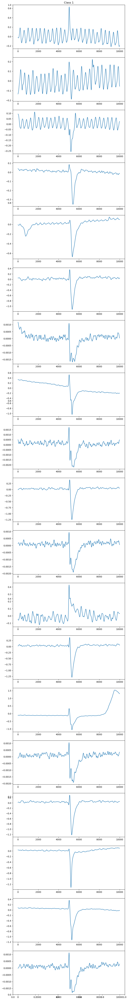

In [250]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 1")
class1_ca1 = ca1_filt[ca1_hdb_fourier==-1]
for i in range(clast_nums_ca1_fourier[1][0]):
    ax = fig.add_subplot(clast_nums_ca1_fourier[1][0], 1, i+1)
    ax.plot(class1_ca1[i])
plt.savefig("Class1Fourier.pdf")    

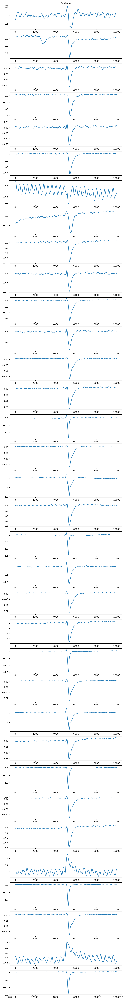

In [251]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 2")
class2_ca1 = ca1_filt[ca1_hdb_fourier==0]
for i in range(clast_nums_ca1_fourier[1][1]):
    ax = fig.add_subplot(clast_nums_ca1_fourier[1][1], 1, i+1)
    ax.plot(class2_ca1[i])
plt.savefig("Class2Fourier.pdf")    

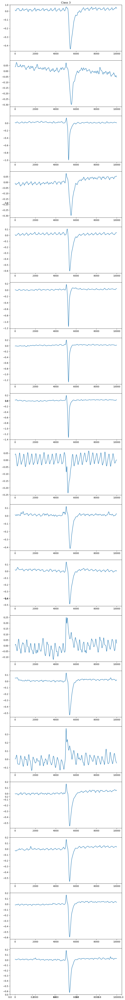

In [252]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 3")
class3_ca1 = ca1_filt[ca1_hdb_fourier==1]
for i in range(clast_nums_ca1_fourier[1][2]):
    ax = fig.add_subplot(clast_nums_ca1_fourier[1][2], 1, i+1)
    ax.plot(class3_ca1[i])
plt.savefig("Class3Fourier.pdf")    

### Используемые в тренировке

In [2]:
trained_sigs = np.load("all_sigs.npy", allow_pickle=True).tolist()

In [3]:
ca1 = []
ca3 = []
for key in trained_sigs.keys():
    print(key, len(trained_sigs[key]))
    for rec in trained_sigs[key]:
        
        ca1.append(rec[0][0][:10000])
        ca3.append(rec[0][1][:10000])  

ca1 = np.array(ca1)
ca3 = np.array(ca3)


100 4
200 4
300 5
400 4
500 5
600 10
700 10
800 12
900 10
1000 15


In [4]:
pca = PCA(n_components=len(ca1))
ca1_transformed = pca.fit_transform(ca1)

In [272]:
pca.explained_variance_/pca.explained_variance_.sum()

array([5.21615130e-01, 2.88331535e-01, 1.05343199e-01, 3.36201442e-02,
       1.22376247e-02, 7.36255870e-03, 6.03179791e-03, 4.49478897e-03,
       3.42875053e-03, 3.01342442e-03, 2.34027597e-03, 1.98906995e-03,
       1.46363669e-03, 1.12028335e-03, 1.01060626e-03, 8.18006566e-04,
       7.21957915e-04, 6.38621998e-04, 4.87020680e-04, 4.14824791e-04,
       3.36672052e-04, 2.97335170e-04, 2.81801885e-04, 2.67433620e-04,
       2.18303744e-04, 1.88242017e-04, 1.76065684e-04, 1.63539412e-04,
       1.43760339e-04, 1.36320204e-04, 1.27336539e-04, 1.17102721e-04,
       9.75997670e-05, 9.13499481e-05, 8.80091826e-05, 7.96413666e-05,
       7.35199754e-05, 6.49365549e-05, 5.96008281e-05, 5.76872259e-05,
       5.47725313e-05, 4.54209329e-05, 4.34860666e-05, 3.60273272e-05,
       3.37585394e-05, 3.08206454e-05, 2.94000309e-05, 2.79632995e-05,
       2.50330324e-05, 2.46497472e-05, 2.28221274e-05, 2.11416250e-05,
       1.87548168e-05, 1.49448470e-05, 1.16453401e-05, 9.84334196e-06,
      

Взвешенный PCA вклад 52%, 29%, 10%

In [4]:
hdb = HDBSCAN(min_cluster_size=6)
ca1_hdb = hdb.fit_predict(ca1)
ca3_hdb = hdb.fit_predict(ca3)

In [5]:
import matplotlib.ticker as ticker

Text(0, 0.5, 'Norm. fEPSP, mV')

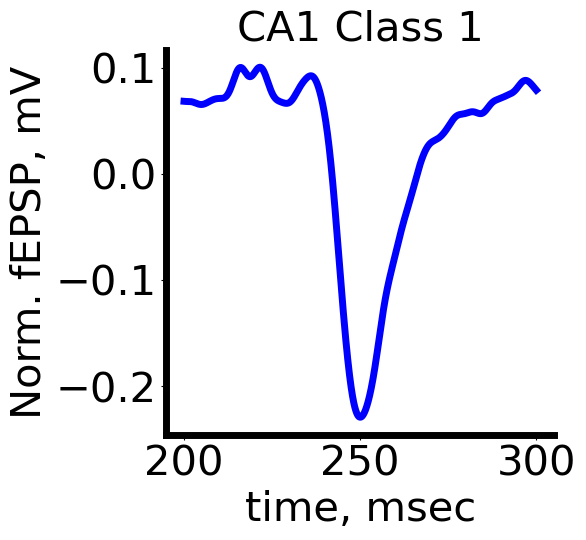

In [33]:
fig = plt.figure(figsize=(5, 5))
plt.title("CA1 Class 1", size=30)
class1_ca1 = ca1[ca1_hdb==-1]
plt.plot(np.arange(200, 300, 0.05), class1_ca1[3][4000:6000], linewidth = 5, color = "blue")
plt.tick_params(axis='both', which='major', labelsize=30)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(5)
plt.gca().spines['left'].set_linewidth(5)
plt.xlabel("time, msec", size=30)
plt.ylabel("Norm. fEPSP, mV", size=30)

Text(0, 0.5, 'Norm. fEPSP, mV')

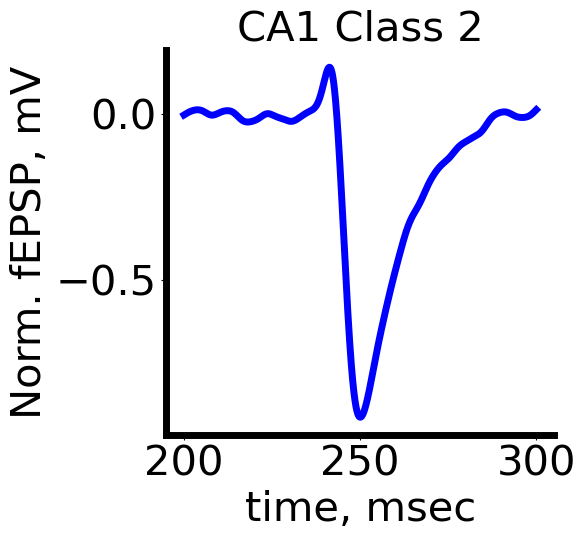

In [32]:
fig = plt.figure(figsize=(5, 5))
plt.title("CA1 Class 2", size=30)
class2_ca1 = ca1[ca1_hdb==0]
plt.plot(np.arange(200, 300, 0.05), class2_ca1[-9][4000:6000], linewidth = 5, color = "blue")
plt.tick_params(axis='both', which='major', labelsize=30)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(5)
plt.gca().spines['left'].set_linewidth(5)
plt.xlabel("time, msec", size=30)
plt.ylabel("Norm. fEPSP, mV", size=30)

Text(0, 0.5, 'Norm. fEPSP, mV')

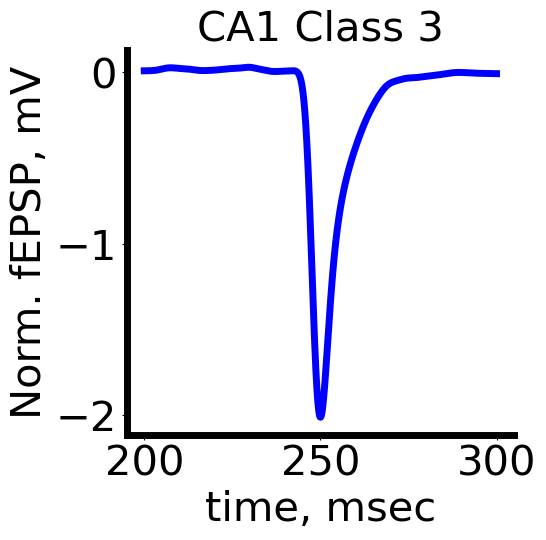

In [31]:
fig = plt.figure(figsize=(5, 5))
plt.title("CA1 Class 3", size=30)
class3_ca1 = ca1[ca1_hdb==1]
plt.plot(np.arange(200, 300, 0.05), class3_ca1[-1][4000:6000], linewidth = 5, color = "blue")
plt.tick_params(axis='both', which='major', labelsize=30)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(5)
plt.gca().spines['left'].set_linewidth(5)
plt.xlabel("time, msec", size=30)
plt.ylabel("Norm. fEPSP, mV", size=30)

In [275]:
clast_nums = np.unique(ca1_hdb, return_counts=True)

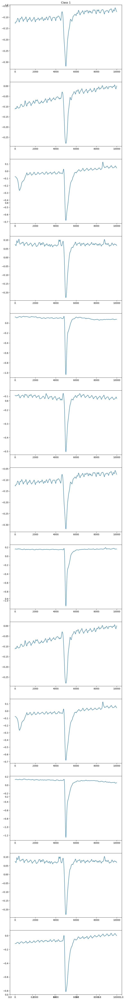

In [280]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 1")
class1_ca1 = ca1[ca1_hdb==-1]
for i in range(clast_nums[1][0]):
    ax = fig.add_subplot(clast_nums[1][0], 1, i+1)
    ax.plot(class1_ca1[i])
plt.savefig("Class1UsedInTrain.pdf")         

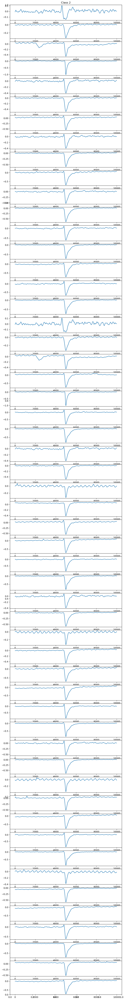

In [281]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 2")
class2_ca1 = ca1[ca1_hdb==0]
for i in range(clast_nums[1][1]):
    ax = fig.add_subplot(clast_nums[1][1], 1, i+1)
    ax.plot(class2_ca1[i])
plt.savefig("Class2UsedInTrain.pdf")         

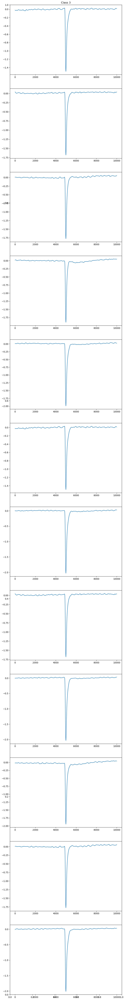

In [282]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 3")
class3_ca1 = ca1[ca1_hdb==1]
for i in range(clast_nums[1][2]):
    ax = fig.add_subplot(clast_nums[1][2], 1, i+1)
    ax.plot(class3_ca1[i])
plt.savefig("Class3UsedInTrain.pdf")         

In [291]:
metrics_ca1 = np.array([normMetrics(rec) for rec in ca1])
metrics_ca3 = np.array([normMetrics(rec) for rec in ca3])


In [320]:
columns = ["Slope", "Half Width", "Time Decrease", "Time Rise", "Amplitude"]
df_ca1 = pd.DataFrame(metrics_ca1, columns=columns)
df_ca3 = pd.DataFrame(metrics_ca3, columns=columns)


Text(0.5, 1.0, 'Correlation Heatmap')

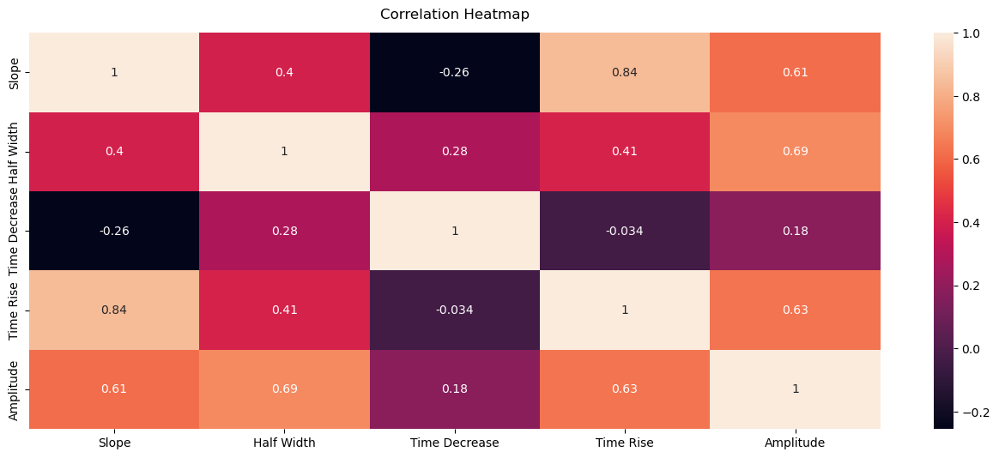

In [321]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(df_ca1.corr(), annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [292]:
metrics_ca1 = (metrics_ca1 - metrics_ca1.mean(axis=0)[None, ...]) / metrics_ca1.std(axis=0)[None, ...]
metrics_ca3 = (metrics_ca3 - metrics_ca3.mean(axis=0)[None, ...]) / metrics_ca3.std(axis=0)[None, ...]

columns = ["Slope", "Half Width", "Time Decrise", "Time Rise", "Amplitude"]
df_ca1 = pd.DataFrame(metrics_ca1, columns=columns)
df_ca3 = pd.DataFrame(metrics_ca3, columns=columns)

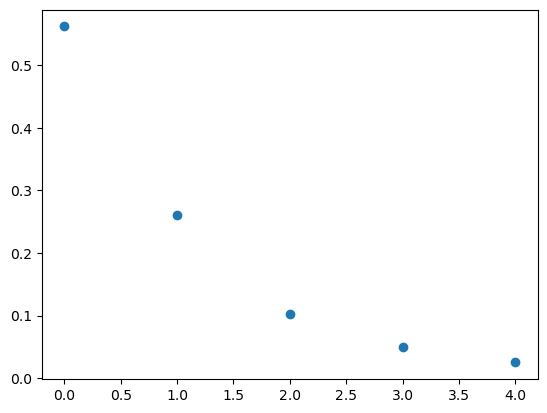

In [317]:
pca = PCA(n_components=5)
ca1_transformed_metrics = pca.fit_transform(metrics_ca1)

plt.scatter(np.arange(5), pca.explained_variance_/pca.explained_variance_.sum())

In [319]:
pca.components_

array([[ 0.51031987,  0.43719628,  0.03800613,  0.51940139,  0.52650811],
       [ 0.3688008 , -0.38812708, -0.79865442,  0.20650827, -0.18124237],
       [ 0.1750752 , -0.62552317,  0.55204216,  0.49234549, -0.17582609],
       [-0.16921638, -0.51087038, -0.07072278, -0.220143  ,  0.81050146],
       [ 0.73774935, -0.07712974,  0.22573081, -0.6298488 , -0.04596724]])

Это матрица проекции на новый базис в pca, возможно, можно итеративно улучшать, чтобы первая компонента вносила абсолютный вклад, или можно посчитать, наверное)

In [318]:
pca.explained_variance_/pca.explained_variance_.sum()

array([0.56211965, 0.26073148, 0.10291322, 0.04928416, 0.02495148])

Text(0.5, 1.0, 'Normed correlation Heatmap')

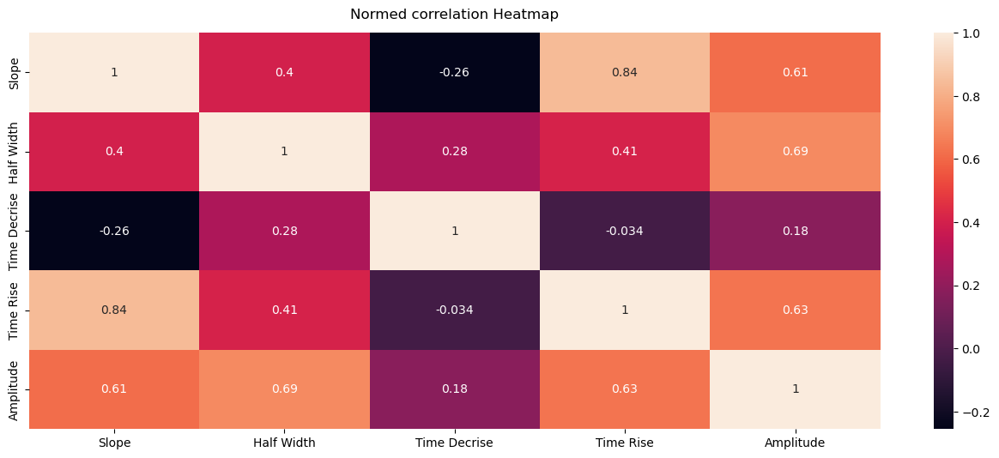

In [293]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(df_ca1.corr(), annot=True)
heatmap.set_title('Normed correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [308]:
eigs, _ = np.linalg.eig(df_ca1.corr())

In [310]:
eigs

array([2.81059825, 1.30365742, 0.5145661 , 0.1247574 , 0.24642082])

In [309]:
inv_eigs = 1 / eigs

In [311]:
inv_eigs

array([0.35579614, 0.76707269, 1.9433849 , 8.01555643, 4.0580987 ])

In [316]:
our_weights = [0.05, 0.4, 0.05, 0.3, 0.2]
print("Order is Slope, Half Width, Time Decay, Time Rise, Amplitude")
print("our weights", our_weights)
print("Обратные собственные числа", inv_eigs / inv_eigs.sum())


Order is Slope, Half Width, Time Decay, Time Rise, Amplitude
our weights [0.05, 0.4, 0.05, 0.3, 0.2]
Обратные собственные числа [0.02350055 0.05066561 0.12836173 0.52943228 0.26803984]


In [297]:
hdb = HDBSCAN(min_cluster_size=6)
ca1_hdb = hdb.fit_predict(metrics_ca1)
ca3_hdb = hdb.fit_predict(metrics_ca3)
clast_nums = np.unique(ca1_hdb, return_counts=True)

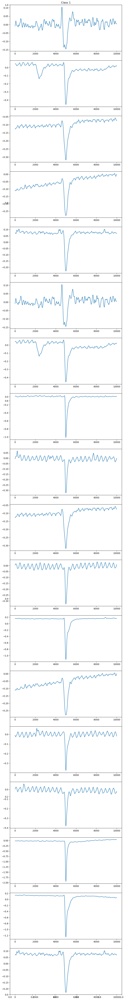

In [299]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 1")
class1_ca1 = ca1[ca1_hdb==-1]
for i in range(clast_nums[1][0]):
    ax = fig.add_subplot(clast_nums[1][0], 1, i+1)
    ax.plot(class1_ca1[i])
plt.savefig("Class1UsedInTrainMetric.pdf")         

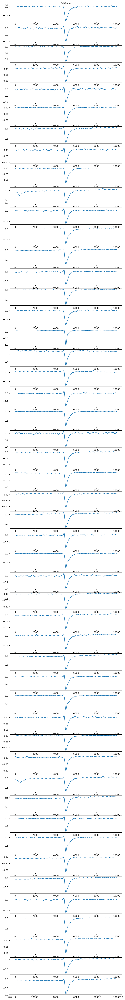

In [300]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 2")
class2_ca1 = ca1[ca1_hdb==0]
for i in range(clast_nums[1][1]):
    ax = fig.add_subplot(clast_nums[1][1], 1, i+1)
    ax.plot(class2_ca1[i])
plt.savefig("Class2UsedInTrainMetric.pdf")         

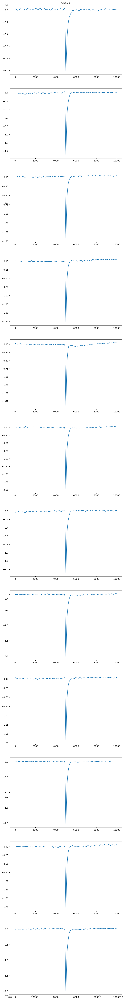

In [301]:
fig = plt.figure(figsize=(9, 80))
plt.title("Class 3")
class3_ca1 = ca1[ca1_hdb==1]
for i in range(clast_nums[1][2]):
    ax = fig.add_subplot(clast_nums[1][2], 1, i+1)
    ax.plot(class3_ca1[i])
plt.savefig("Class3UsedInTrainMetric.pdf")         

### По метрике

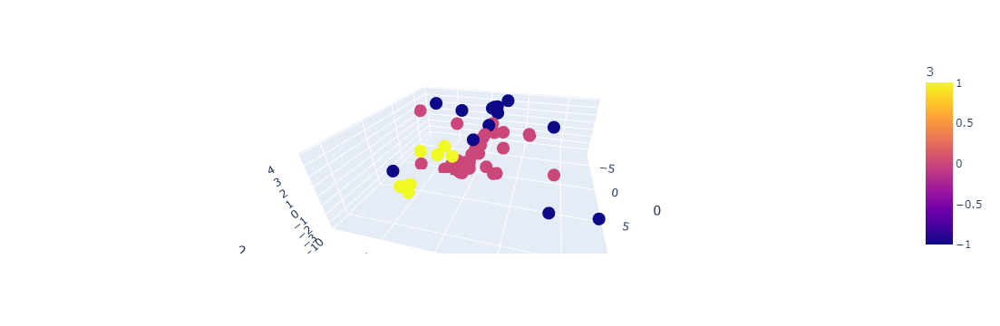

In [302]:
pca = PCA(n_components=3)
ca1_transformed3d = pca.fit_transform(ca1)
df = pd.DataFrame(np.concatenate([ca1_transformed3d, ca1_hdb[..., None]], axis=1))
fig = px.scatter_3d(df, x=0, y=1, z=2, color=3)
fig.show()

### По записи

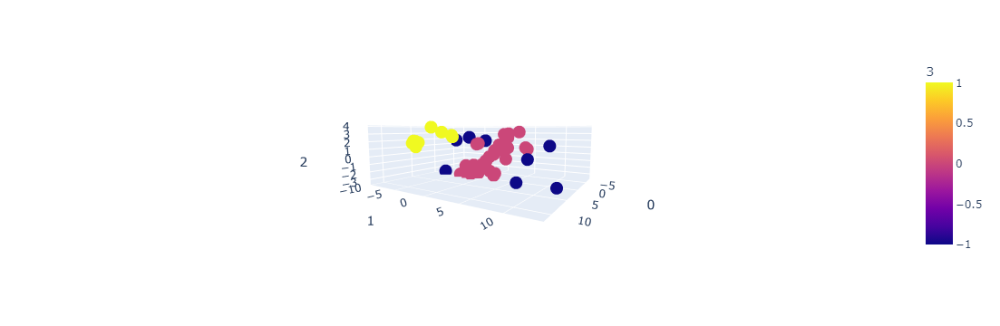

In [304]:
pca = PCA(n_components=3)
ca1_transformed3d = pca.fit_transform(ca1)
df = pd.DataFrame(np.concatenate([ca1_transformed3d, ca1_hdb[..., None]], axis=1))
fig = px.scatter_3d(df, x=0, y=1, z=2, color=3)
fig.show()